In [ ]:
!nvidia-smi

Thu May  2 13:40:00 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
# Pip install method (recommended)

!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 28.8/78.2 GB disk)


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='https://media.roboflow.com/notebooks/examples/dog.jpeg' save=True

/content
100% 6.23M/6.23M [00:00<00:00, 23.7MB/s]
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs

100% 104k/104k [00:00<00:00, 117MB/s]
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/dog.jpeg: 640x384 1 person, 1 car, 1 dog, 92.7ms
Speed: 12.4ms preprocess, 92.7ms inference, 740.3ms postprocess per image at shape (1, 3, 640, 384)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


/content


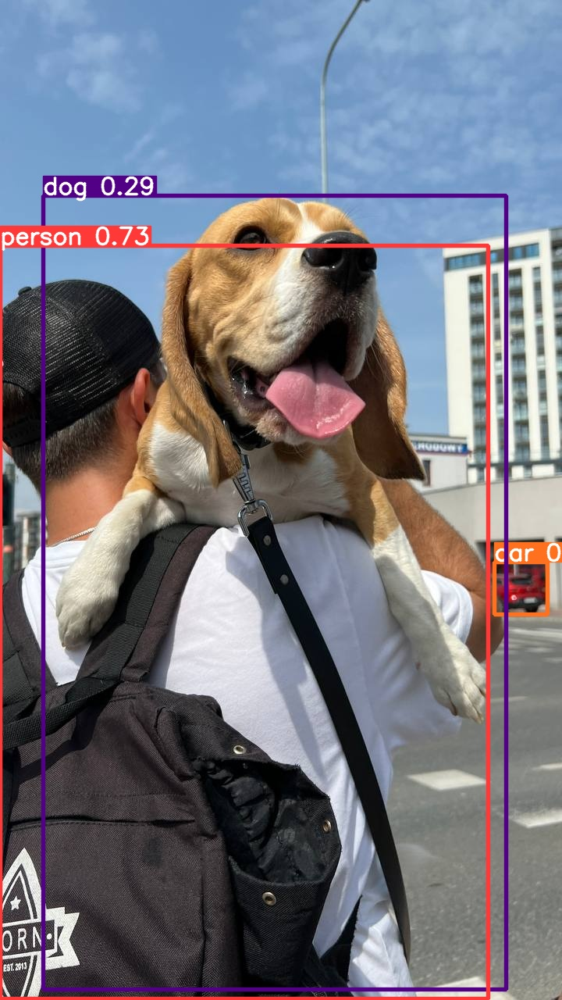

In [ ]:
%cd {HOME}
Image(filename='runs/detect/predict/dog.jpeg', height=600)

In [ ]:
!pip install inference-sdk

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.0/111.0 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.3/49.3 kB 7.5 MB/s eta 0:00:00


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="6thB8YwhZHz6XHVIYJqr")
project = rf.workspace("visually-impaired-obstacle-detection-uxdze").project("obstacle-detection-yeuzf")
version = project.version(11)
dataset = version.download("yolov8")




     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.6/74.6 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 25.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 13.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 9.0 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
  Attempting uninstall: idna
    Found existing installation: idna 3.7
    Uninstalling idna-3.7:
      Successfully uninstalled idna-3.7
  Attempting uninstall: cycler
    Found existing installation: cycler 0.12.1
    Uninstalling cycler-0.12.1:
      Successfully uninstalled cycler-0

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Obstacle-detection-11 in yolov8:: 100%|██████████| 18378/18378 [00:13<00:00, 1387.51it/s]


In [ ]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=3 imgsz=800 plots=True

/content
100% 21.5M/21.5M [00:00<00:00, 261MB/s]
New https://pypi.org/project/ultralytics/8.2.6 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/Obstacle-detection-11/data.yaml, epochs=3, patience=50, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffe

In [ ]:
!ls {HOME}/runs/detect/train/


args.yaml					    PR_curve.png	   val_batch0_pred.jpg
confusion_matrix_normalized.png			    R_curve.png		   val_batch1_labels.jpg
confusion_matrix.png				    results.csv		   val_batch1_pred.jpg
events.out.tfevents.1714657538.44dd2ad08f28.3149.0  results.png		   val_batch2_labels.jpg
F1_curve.png					    train_batch0.jpg	   val_batch2_pred.jpg
labels_correlogram.jpg				    train_batch1.jpg	   weights
labels.jpg					    train_batch2.jpg
P_curve.png					    val_batch0_labels.jpg


/content


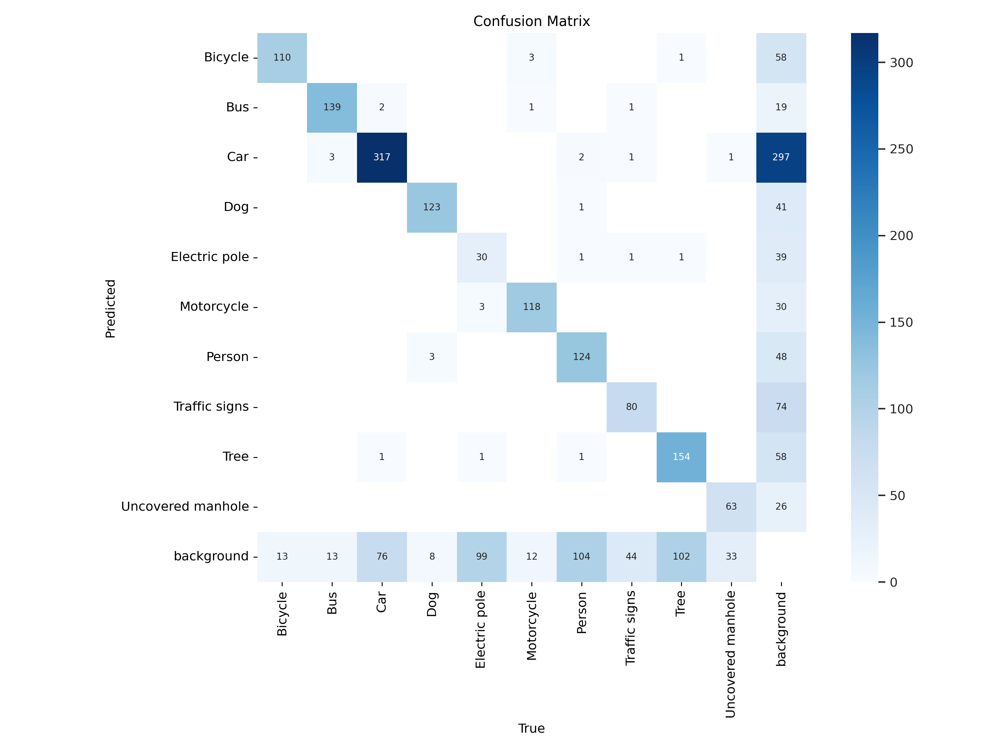

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

/content


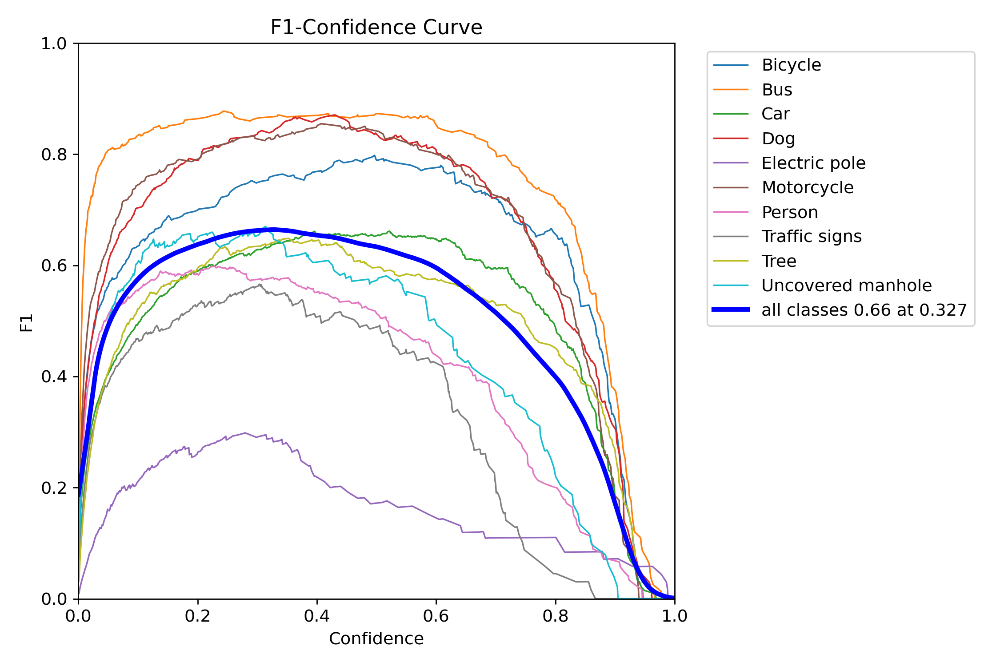

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/F1_curve.png', width=600)

/content


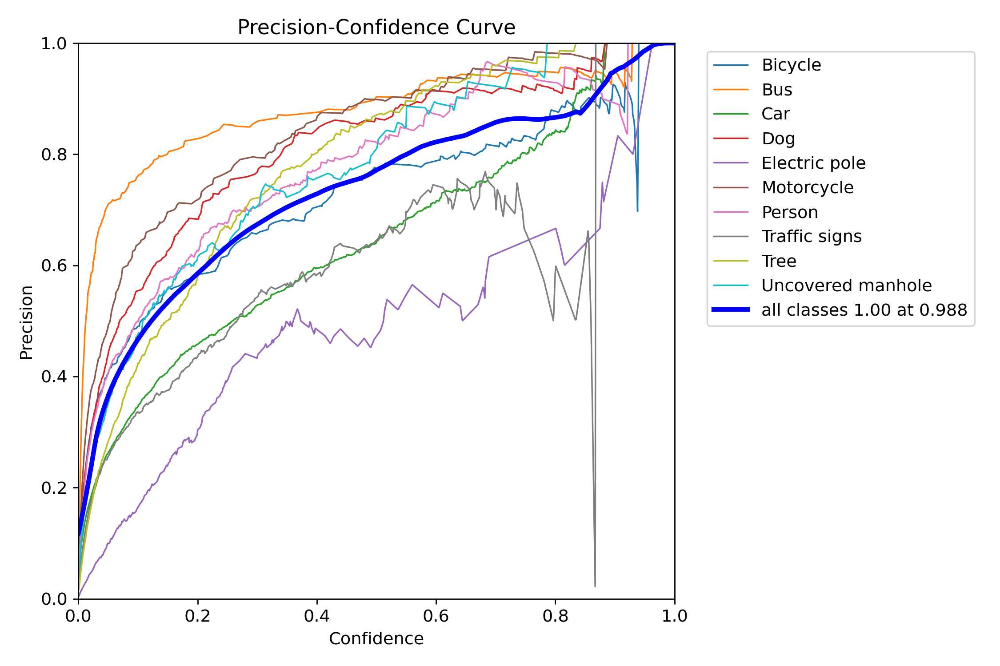

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/P_curve.png', width=600)

/content


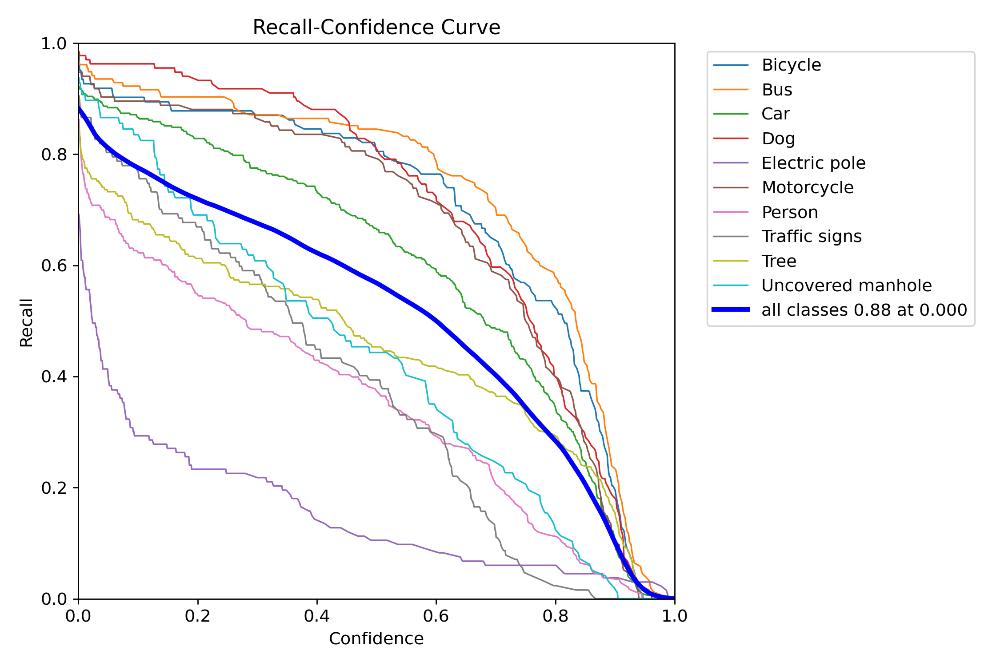

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/R_curve.png', width=600)

/content


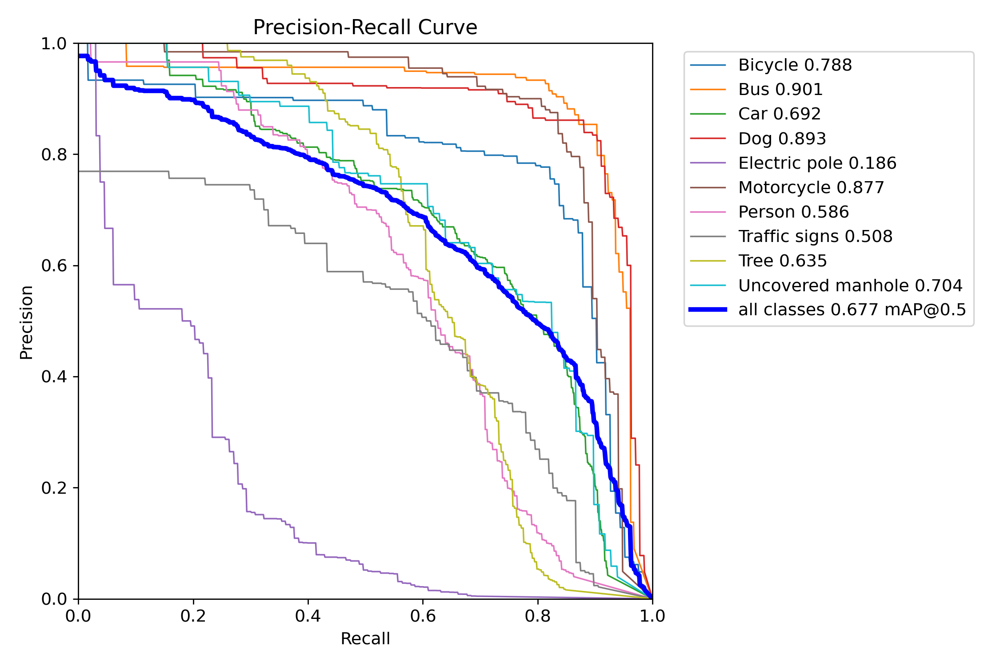

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/PR_curve.png', width=600)

/content


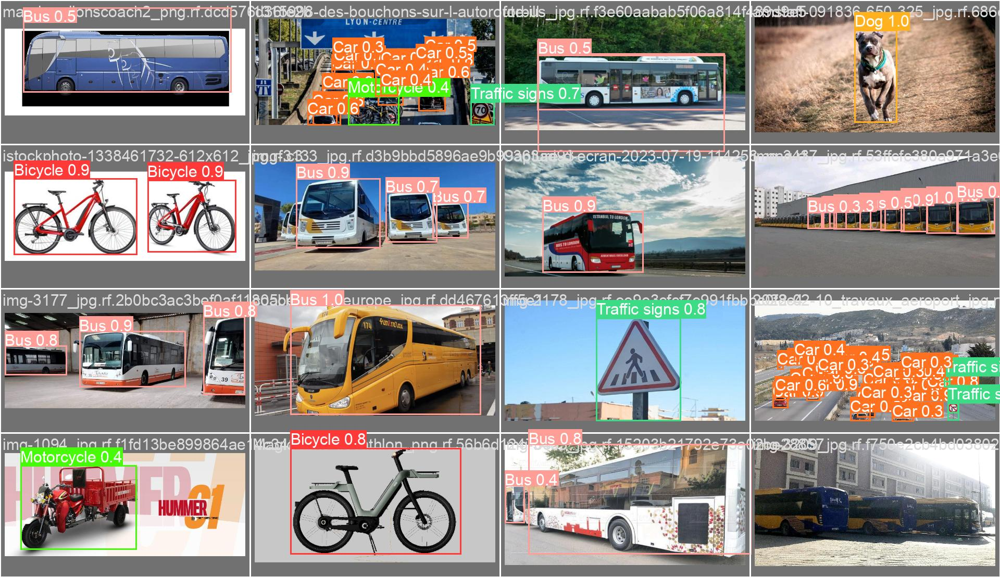

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=600)

/content


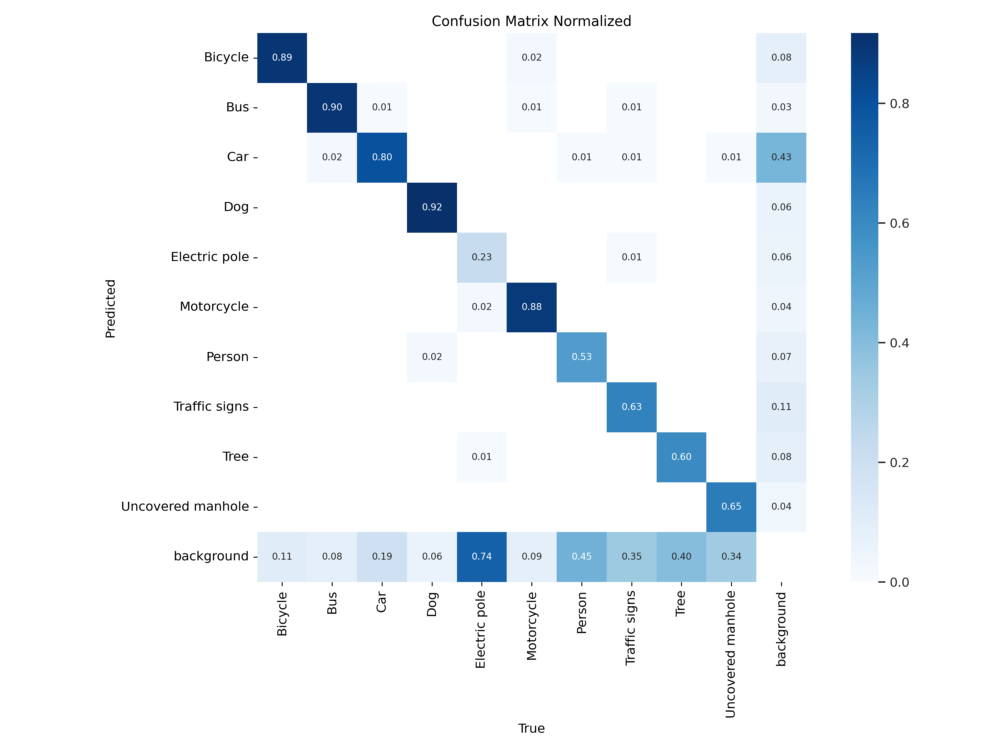

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix_normalized.png', width=600)

/content


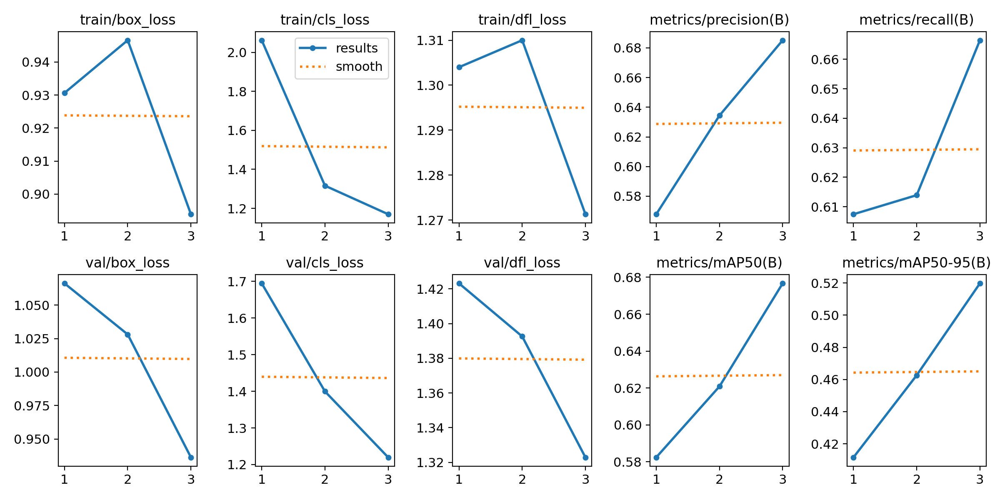

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

/content


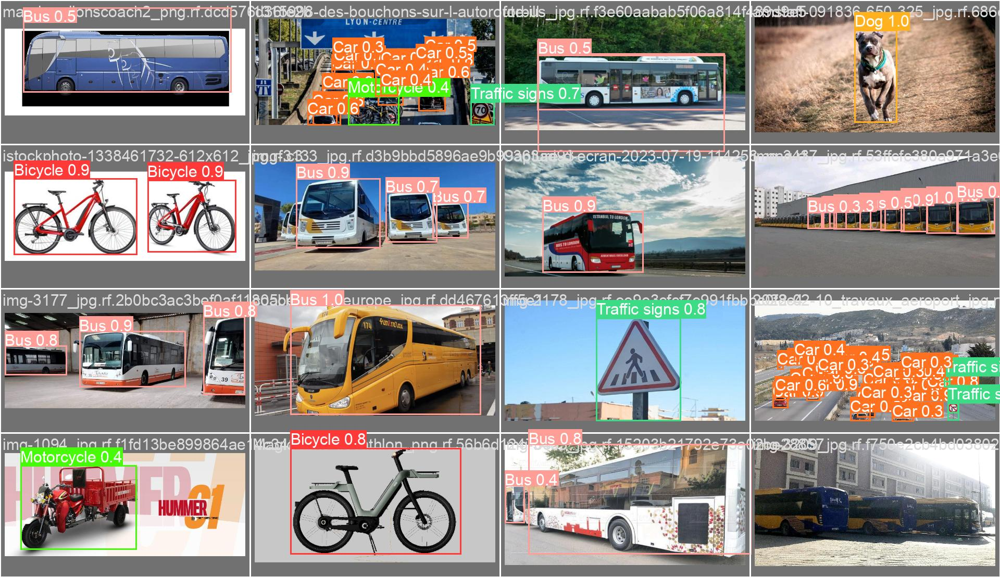

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=600)

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/val/results.png', width=600)

In [ ]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11129454 parameters, 0 gradients, 28.5 GFLOPs
val: Scanning /content/Obstacle-detection-11/valid/labels.cache... 865 images, 10 backgrounds, 0 corrupt: 100% 865/865 [00:00<?, ?it/s]
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 1739, len(boxes) = 1790. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 55/55 [00:39<00:00,  1.40it/s]
                   all        865       1790      0.68

In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11129454 parameters, 0 gradients, 28.5 GFLOPs

image 1/463 /content/Obstacle-detection-11/test/images/01_main_entry_img_jpg.rf.b9cf63d13b5419bd66cc9b10c08e39b6.jpg: 640x800 1 Bus, 71.8ms
image 2/463 /content/Obstacle-detection-11/test/images/02-piaggio-mp3-500-2018-business-perfil-azul_jpg.rf.37328c1a548af8de08c632afe17def02.jpg: 576x800 1 Motorcycle, 70.4ms
image 3/463 /content/Obstacle-detection-11/test/images/0806-neue-e-busse-800x600_jpg.rf.4a4d63251d703f08b7cfb93194e48705.jpg: 608x800 1 Bus, 71.2ms
image 4/463 /content/Obstacle-detection-11/test/images/0ac8d2598779f97644985c01d8766127640b78b1_jpg.rf.f68416a3a0fe2f792b4d488ecda039c8.jpg: 800x800 1 Tree, 23.1ms
image 5/463 /content/Obstacle-detection-11/test/images/0d3917811dba058be6c229e3e6971a5459e6fd88_jpg.rf.db7167f0f0e8d60f520fa05268e26222.jpg: 800x800 1 Tree, 22.5ms
image 6/463 /content/Obstacle-d

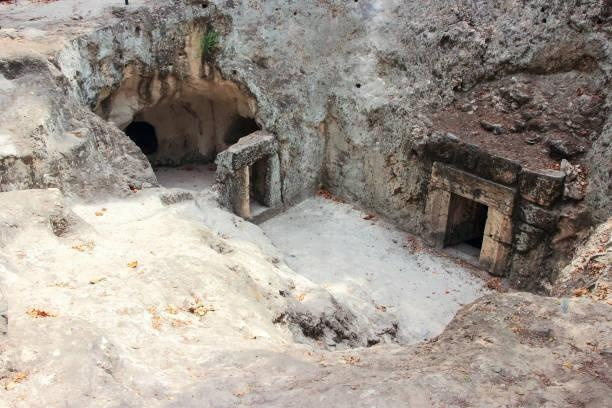

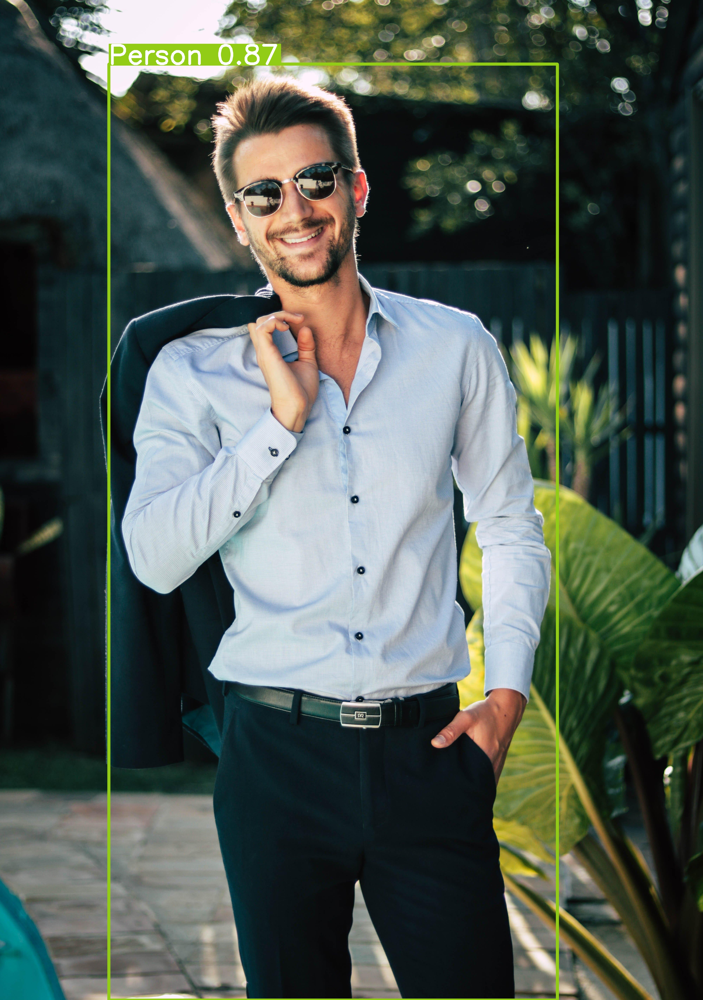

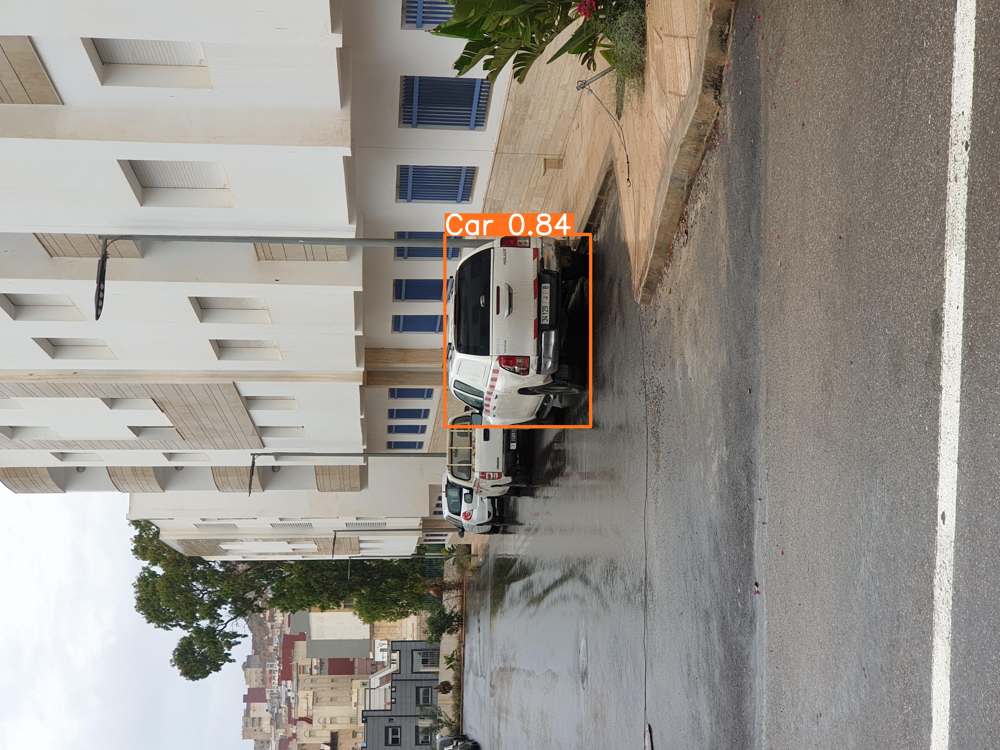

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict2/*.jpg')[:3]:
      display(Image(filename=image_path, width=600))
      print("\n")

In [ ]:

!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source=/content/video.mp4

Streaming output truncated to the last 5000 lines.
video 1/1 (2741/7737) /content/video.mp4: 480x800 33 Cars, 10.8ms
video 1/1 (2742/7737) /content/video.mp4: 480x800 31 Cars, 7.7ms
video 1/1 (2743/7737) /content/video.mp4: 480x800 29 Cars, 7.7ms
video 1/1 (2744/7737) /content/video.mp4: 480x800 27 Cars, 7.7ms
video 1/1 (2745/7737) /content/video.mp4: 480x800 27 Cars, 7.8ms
video 1/1 (2746/7737) /content/video.mp4: 480x800 29 Cars, 7.7ms
video 1/1 (2747/7737) /content/video.mp4: 480x800 31 Cars, 7.7ms
video 1/1 (2748/7737) /content/video.mp4: 480x800 32 Cars, 7.7ms
video 1/1 (2749/7737) /content/video.mp4: 480x800 28 Cars, 7.7ms
video 1/1 (2750/7737) /content/video.mp4: 480x800 29 Cars, 7.7ms
video 1/1 (2751/7737) /content/video.mp4: 480x800 30 Cars, 7.7ms
video 1/1 (2752/7737) /content/video.mp4: 480x800 29 Cars, 10.0ms
video 1/1 (2753/7737) /content/video.mp4: 480x800 29 Cars, 7.8ms
video 1/1 (2754/7737) /content/video.mp4: 480x800 32 Cars, 7.7ms
video 1/1 (2755/7737) /content/video.

In [ ]:
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source=/content/video1.mp4

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11129454 parameters, 0 gradients, 28.5 GFLOPs

WARNING ⚠️ NMS time limit 0.550s exceeded
video 1/1 (1/1057) /content/video1.mp4: 480x800 16 Cars, 173.4ms
video 1/1 (2/1057) /content/video1.mp4: 480x800 16 Cars, 15.7ms
video 1/1 (3/1057) /content/video1.mp4: 480x800 16 Cars, 15.6ms
video 1/1 (4/1057) /content/video1.mp4: 480x800 17 Cars, 15.6ms
video 1/1 (5/1057) /content/video1.mp4: 480x800 16 Cars, 15.7ms
video 1/1 (6/1057) /content/video1.mp4: 480x800 16 Cars, 15.6ms
video 1/1 (7/1057) /content/video1.mp4: 480x800 1 Bus, 17 Cars, 15.6ms
video 1/1 (8/1057) /content/video1.mp4: 480x800 1 Bus, 19 Cars, 15.6ms
video 1/1 (9/1057) /content/video1.mp4: 480x800 1 Bus, 19 Cars, 15.6ms
video 1/1 (10/1057) /content/video1.mp4: 480x800 1 Bus, 20 Cars, 15.6ms
video 1/1 (11/1057) /content/video1.mp4: 480x800 18 Cars, 13.1ms
video 1/1 (12/1057) /content/video1.mp4: 480x800 1 Bu

In [ ]:
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source=/content/video2.mp4

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11129454 parameters, 0 gradients, 28.5 GFLOPs

video 1/1 (1/1179) /content/video2.mp4: 480x800 (no detections), 114.5ms
video 1/1 (2/1179) /content/video2.mp4: 480x800 (no detections), 15.6ms
video 1/1 (3/1179) /content/video2.mp4: 480x800 (no detections), 15.5ms
video 1/1 (4/1179) /content/video2.mp4: 480x800 (no detections), 15.5ms
video 1/1 (5/1179) /content/video2.mp4: 480x800 (no detections), 15.6ms
video 1/1 (6/1179) /content/video2.mp4: 480x800 (no detections), 15.5ms
video 1/1 (7/1179) /content/video2.mp4: 480x800 (no detections), 15.5ms
video 1/1 (8/1179) /content/video2.mp4: 480x800 (no detections), 15.6ms
video 1/1 (9/1179) /content/video2.mp4: 480x800 (no detections), 15.6ms
video 1/1 (10/1179) /content/video2.mp4: 480x800 (no detections), 15.5ms
video 1/1 (11/1179) /content/video2.mp4: 480x800 (no detections), 15.5ms
video 1/1 (12/1179) /content/video2